# Bubble Detector Testing Notebook

This notebook allows you to manually test the bubble detector on comic panel images.

In [1]:
# Import required libraries
import sys
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import numpy as np

# Add src to path
sys.path.insert(0, str(Path.cwd() / 'src'))

# Import directly from the module file to avoid package import issues
import importlib.util
spec = importlib.util.spec_from_file_location(
    "bubble_detector", 
    Path.cwd() / "src" / "image_gen" / "bubble_detector.py"
)
bubble_detector = importlib.util.module_from_spec(spec)
spec.loader.exec_module(bubble_detector)

BubbleDetector = bubble_detector.BubbleDetector
DetectedBubble = bubble_detector.DetectedBubble

In [2]:
# Initialize the bubble detector with adjusted parameters
# Lower white threshold to catch bubbles that might not be pure white
# Increase max area for larger bubbles
detector = BubbleDetector(
    min_bubble_area=4000,       # Minimum area - not too small
    max_bubble_area=500000,     # Much larger max area
    white_threshold=10,        # Lower threshold to catch off-white bubbles
    min_circularity=0.1       # Very permissive circularity
)

detector = BubbleDetector(
    min_bubble_area=7000,       # Minimum area - not too small
    max_bubble_area=500000,     # Much larger max area
    white_threshold=220,        # Lower threshold to catch off-white bubbles
    min_circularity=0.4        # Very permissive circularity
)

print(f"Bubble detector initialized with:")
print(f"  Min area: {detector.min_bubble_area}")
print(f"  Max area: {detector.max_bubble_area}")
print(f"  White threshold: {detector.white_threshold}")
print(f"  Min circularity: {detector.min_circularity}")

Bubble detector initialized with:
  Min area: 7000
  Max area: 500000
  White threshold: 220
  Min circularity: 0.4


Image size: (1024, 1024)
Image mode: RGB


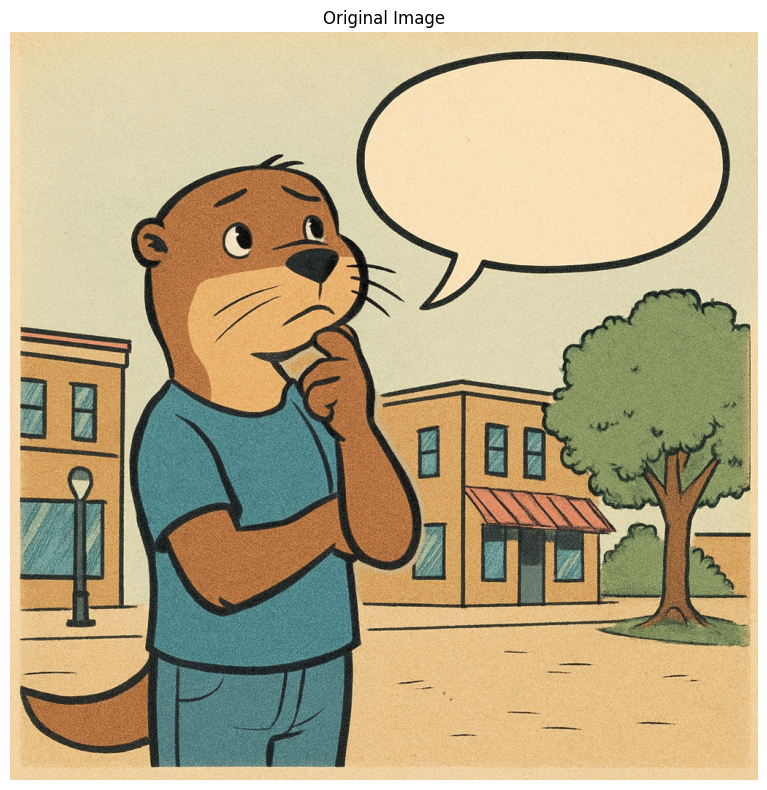

In [3]:
# Load and display the test image
image_paths = ["assets/generated/image_20260117_190335.png", "assets/generated/image_20260117_192107.png", "assets/generated/image_20260117_194740.png"]

image_path = image_paths[2]

# Load with PIL
img = Image.open(image_path)
print(f"Image size: {img.size}")
print(f"Image mode: {img.mode}")

# Display
plt.figure(figsize=(12, 8))
plt.imshow(img)
plt.title("Original Image")
plt.axis('off')
plt.tight_layout()
plt.show()

In [4]:
# Detect bubbles
bubbles = detector.detect_bubbles(image_path)

print(f"Found {len(bubbles)} bubbles\n")

for i, bubble in enumerate(bubbles, 1):
    print(f"Bubble {i}:")
    print(f"  Position: ({bubble.x}, {bubble.y})")
    print(f"  Size: {bubble.width} x {bubble.height}")
    print(f"  Center: ({bubble.center_x}, {bubble.center_y})")
    print(f"  Area: {bubble.area}")
    print()

Found 1 bubbles

Bubble 1:
  Position: (486, 37)
  Size: 489 x 330
  Center: (730, 202)
  Area: 161370



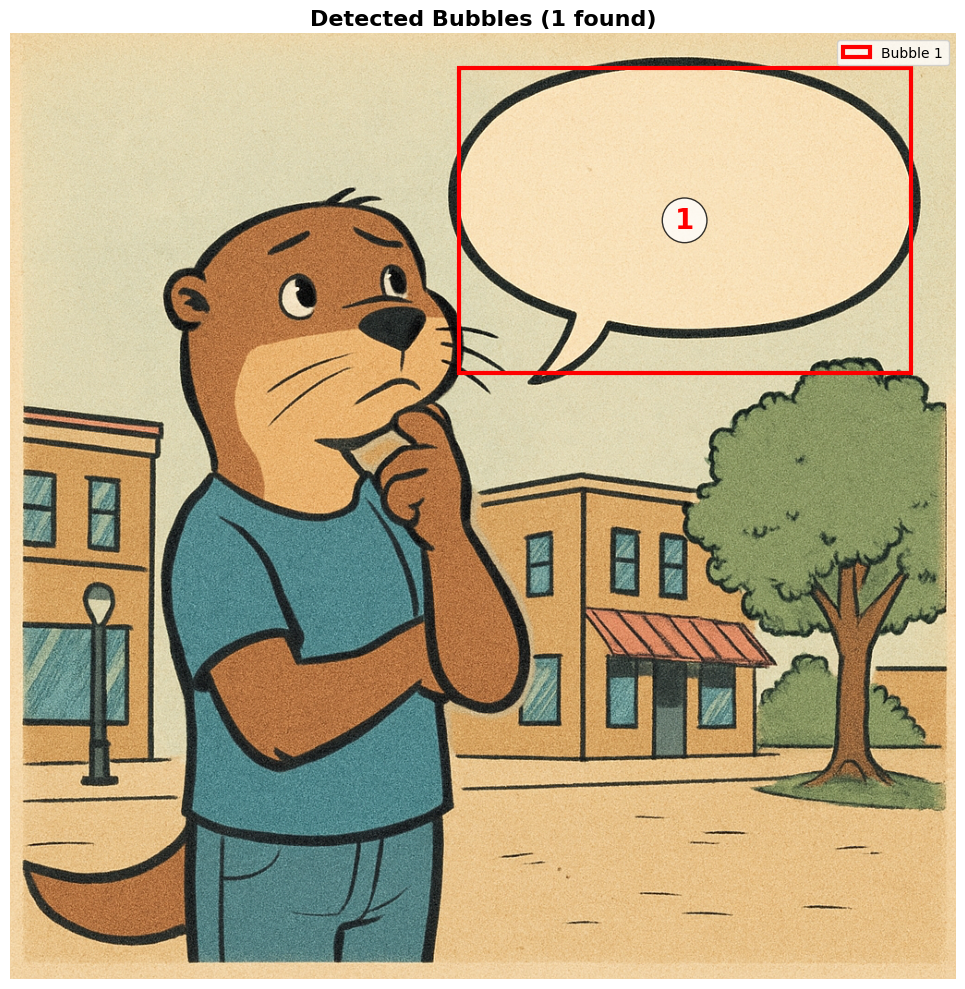

In [5]:
# Visualize detected bubbles
fig, ax = plt.subplots(figsize=(14, 10))
ax.imshow(img)

# Draw rectangles around detected bubbles
colors = ['red', 'blue', 'green', 'yellow', 'cyan', 'magenta', 'orange', 'purple']

for i, bubble in enumerate(bubbles):
    color = colors[i % len(colors)]
    
    # Draw bounding box
    rect = patches.Rectangle(
        (bubble.x, bubble.y),
        bubble.width,
        bubble.height,
        linewidth=3,
        edgecolor=color,
        facecolor='none',
        label=f'Bubble {i+1}'
    )
    ax.add_patch(rect)
    
    # Add label
    ax.text(
        bubble.center_x,
        bubble.center_y,
        str(i+1),
        fontsize=20,
        fontweight='bold',
        color=color,
        ha='center',
        va='center',
        bbox=dict(boxstyle='circle', facecolor='white', alpha=0.8)
    )

ax.set_title(f"Detected Bubbles ({len(bubbles)} found)", fontsize=16, fontweight='bold')
ax.axis('off')
if bubbles:
    ax.legend(loc='upper right', fontsize=10)
plt.tight_layout()
plt.show()

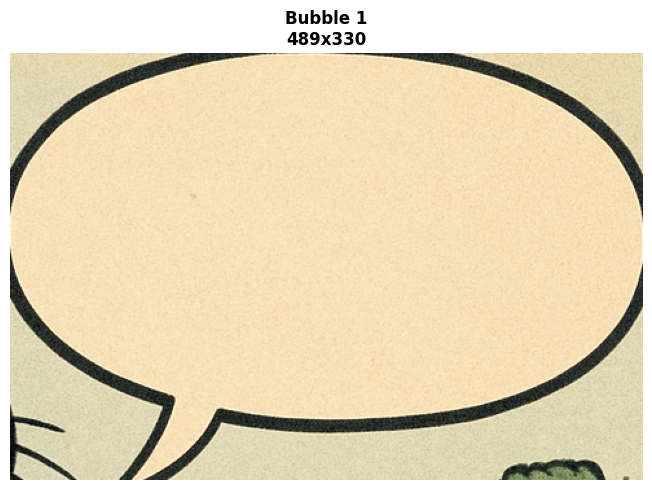

In [6]:
# Show individual bubbles with masks
if bubbles:
    num_bubbles = len(bubbles)
    cols = min(3, num_bubbles)
    rows = (num_bubbles + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
    if num_bubbles == 1:
        axes = [axes]
    else:
        axes = axes.flatten() if num_bubbles > 1 else [axes]
    
    img_array = np.array(img)
    
    for i, (bubble, ax) in enumerate(zip(bubbles, axes)):
        # Extract bubble region
        bubble_region = img_array[bubble.y:bubble.y+bubble.height, bubble.x:bubble.x+bubble.width]
        
        ax.imshow(bubble_region)
        ax.set_title(f'Bubble {i+1}\n{bubble.width}x{bubble.height}', fontweight='bold')
        ax.axis('off')
    
    # Hide unused subplots
    for j in range(num_bubbles, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()
else:
    print("No bubbles detected to display.")

## Adjust Detection Parameters

You can experiment with different parameters to improve detection:

Found 1 bubbles with custom parameters


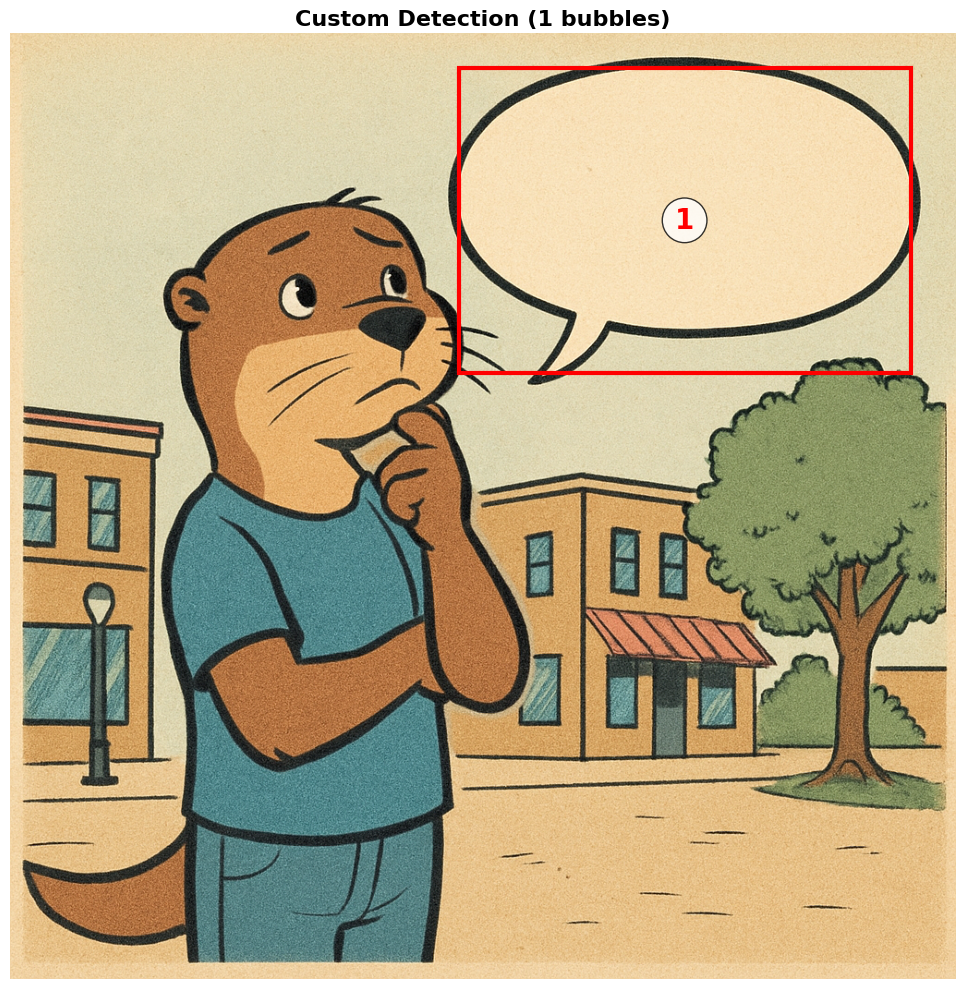

In [7]:
# Create a custom detector with different parameters
custom_detector = BubbleDetector(
    min_bubble_area=3000,      # Smaller minimum area
    max_bubble_area=250000,    # Larger maximum area
    white_threshold=220,       # Lower threshold (more permissive)
    min_circularity=0.2        # Lower circularity (accept more shapes)
)

# Detect with custom parameters
custom_bubbles = custom_detector.detect_bubbles(image_path)
print(f"Found {len(custom_bubbles)} bubbles with custom parameters")

# Visualize
fig, ax = plt.subplots(figsize=(14, 10))
ax.imshow(img)

for i, bubble in enumerate(custom_bubbles):
    color = colors[i % len(colors)]
    rect = patches.Rectangle(
        (bubble.x, bubble.y),
        bubble.width,
        bubble.height,
        linewidth=3,
        edgecolor=color,
        facecolor='none'
    )
    ax.add_patch(rect)
    ax.text(
        bubble.center_x,
        bubble.center_y,
        str(i+1),
        fontsize=20,
        fontweight='bold',
        color=color,
        ha='center',
        va='center',
        bbox=dict(boxstyle='circle', facecolor='white', alpha=0.8)
    )

ax.set_title(f"Custom Detection ({len(custom_bubbles)} bubbles)", fontsize=16, fontweight='bold')
ax.axis('off')
plt.tight_layout()
plt.show()

In [8]:
# Import the text renderer module
# First, make bubble_detector available as a module so relative imports work
import sys
import types

# Create a fake package structure
image_gen_package = types.ModuleType('image_gen')
image_gen_package.bubble_detector = bubble_detector
sys.modules['image_gen'] = image_gen_package
sys.modules['image_gen.bubble_detector'] = bubble_detector

# Now load text_renderer
spec_text = importlib.util.spec_from_file_location(
    "image_gen.text_renderer", 
    Path.cwd() / "src" / "image_gen" / "text_renderer.py"
)
text_renderer_module = importlib.util.module_from_spec(spec_text)
spec_text.loader.exec_module(text_renderer_module)

TextRenderer = text_renderer_module.TextRenderer
TextElement = text_renderer_module.TextElement

print("Text renderer loaded successfully!")

Text renderer loaded successfully!


In [10]:
# Create a text renderer instance
renderer = TextRenderer(
    font_path=None,  # Will use default/system fonts
    default_font_size=20,
    min_font_size=12,
    padding_ratio=0.15,
    line_spacing=1.2
)

print("Text renderer initialized!")

Text renderer initialized!


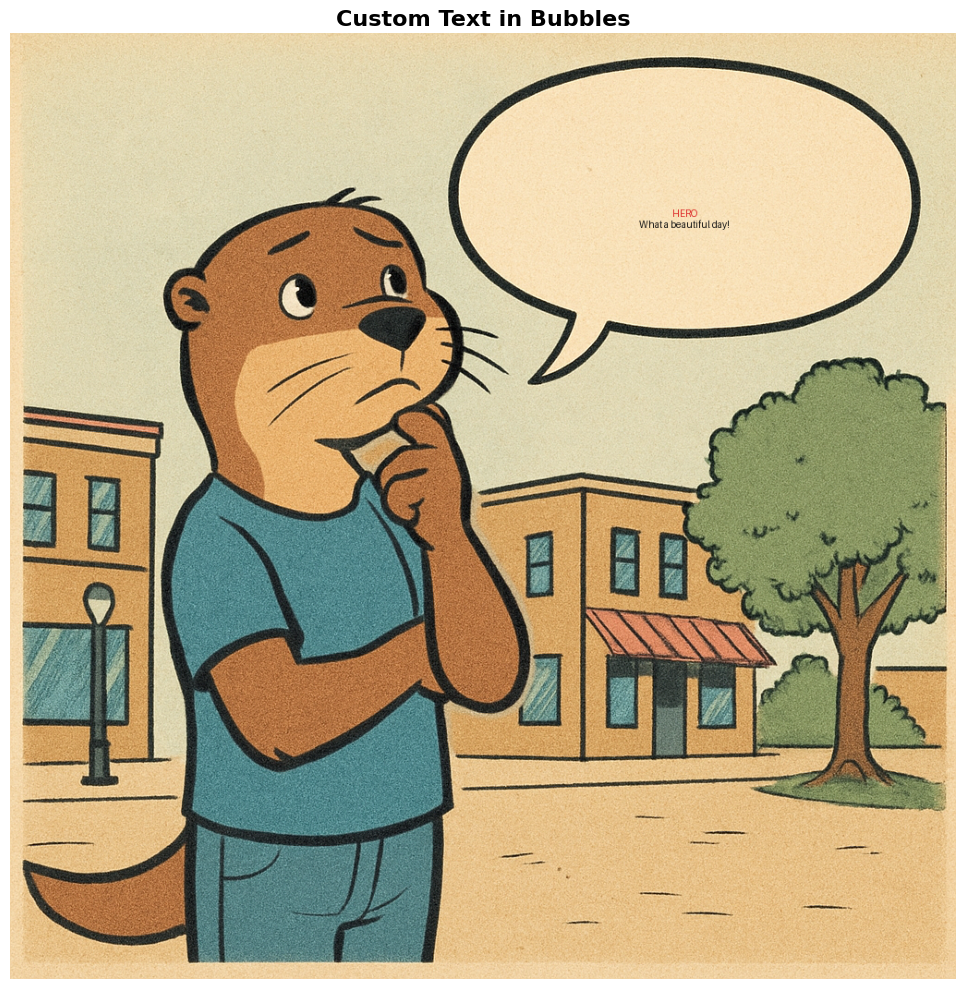

In [11]:
# Create your own text elements
if bubbles:
    custom_texts = []
    
    # Example: fill each bubble with custom text
    # Modify these as needed!
    my_texts = [
        ("What a beautiful day!", "speech", "Hero"),
        ("Something feels wrong...", "thought", "Villain"),
        ("To be continued...", "narration", None),
    ]
    
    for i, bubble in enumerate(bubbles):
        if i < len(my_texts):
            text, elem_type, char_name = my_texts[i]
        else:
            text = f"Bubble {i+1}"
            elem_type = "speech"
            char_name = "Character"
        
        custom_texts.append(TextElement(
            text=text,
            element_type=elem_type,
            character_name=char_name
        ))
    
    # Render custom text
    custom_rendered = Image.open(image_path)
    custom_rendered = renderer.render_all_bubbles(custom_rendered, bubbles, custom_texts)
    
    # Display
    plt.figure(figsize=(14, 10))
    plt.imshow(custom_rendered)
    plt.title("Custom Text in Bubbles", fontsize=16, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()
else:
    print("No bubbles to add custom text to.")

## Custom Text

Try your own custom text in the bubbles:

In [13]:
# Create sample text elements for each detected bubble
if bubbles:
    # Create different types of text elements
    sample_texts = [
        TextElement(text="Hello there!", element_type="speech", character_name="Alice"),
        TextElement(text="I wonder what's happening...", element_type="thought", character_name="Bob"),
        TextElement(text="This is a longer piece of text that should wrap across multiple lines in the bubble.", element_type="speech", character_name="Charlie"),
        TextElement(text="BOOM!", element_type="sfx"),
        TextElement(text="Meanwhile, in another part of town...", element_type="narration"),
    ]
    
    # Match text to bubbles (cycle if needed)
    text_elements = []
    for i in range(len(bubbles)):
        text_elements.append(sample_texts[i % len(sample_texts)])
    
    print(f"Created {len(text_elements)} text elements for {len(bubbles)} bubbles:")
    for i, elem in enumerate(text_elements, 1):
        print(f"  Bubble {i}: [{elem.element_type}] {elem.text[:50]}...")
else:
    print("No bubbles detected - cannot render text!")

Created 1 text elements for 1 bubbles:
  Bubble 1: [speech] Hello there!...


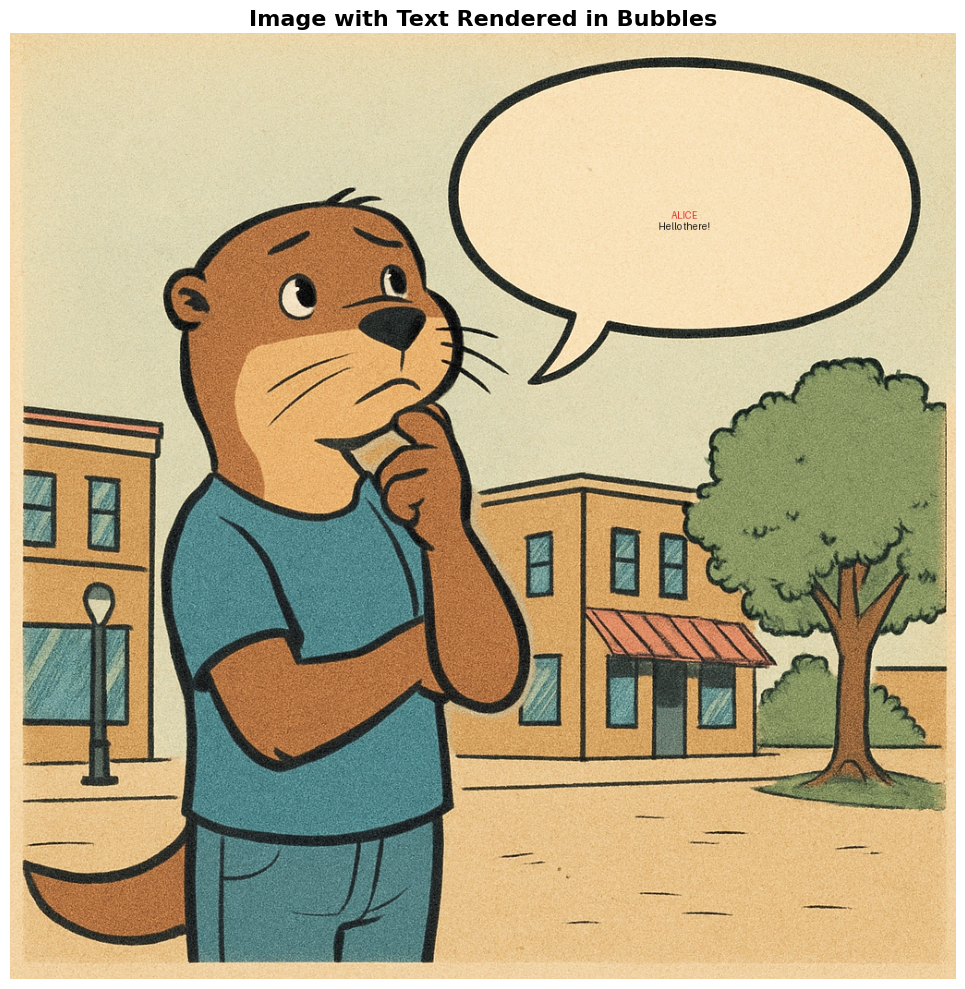

Text rendered in 1 bubbles!


In [14]:
# Render text onto the image
if bubbles:
    # Load fresh copy of image
    rendered_img = Image.open(image_path)
    
    # Render all bubbles
    rendered_img = renderer.render_all_bubbles(rendered_img, bubbles, text_elements)
    
    # Display the result
    plt.figure(figsize=(14, 10))
    plt.imshow(rendered_img)
    plt.title("Image with Text Rendered in Bubbles", fontsize=16, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    print(f"Text rendered in {len(bubbles)} bubbles!")
else:
    print("No bubbles to render text into.")

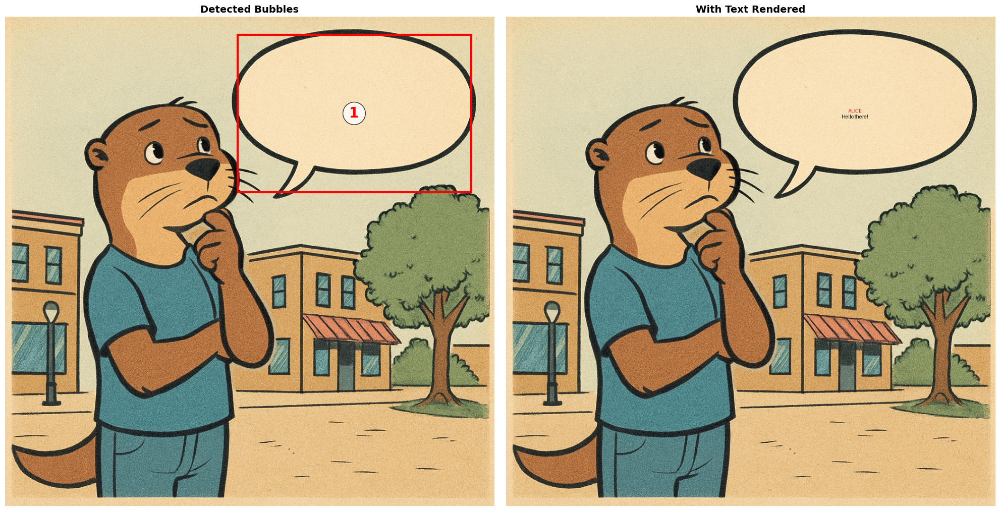

In [15]:
# Show side-by-side comparison
if bubbles:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    
    # Original with bounding boxes
    ax1.imshow(img)
    for i, bubble in enumerate(bubbles):
        color = colors[i % len(colors)]
        rect = patches.Rectangle(
            (bubble.x, bubble.y),
            bubble.width,
            bubble.height,
            linewidth=3,
            edgecolor=color,
            facecolor='none'
        )
        ax1.add_patch(rect)
        ax1.text(
            bubble.center_x,
            bubble.center_y,
            str(i+1),
            fontsize=20,
            fontweight='bold',
            color=color,
            ha='center',
            va='center',
            bbox=dict(boxstyle='circle', facecolor='white', alpha=0.8)
        )
    ax1.set_title("Detected Bubbles", fontsize=14, fontweight='bold')
    ax1.axis('off')
    
    # With text rendered
    ax2.imshow(rendered_img)
    ax2.set_title("With Text Rendered", fontsize=14, fontweight='bold')
    ax2.axis('off')
    
    plt.tight_layout()
    plt.show()
else:
    print("No bubbles to compare.")

In [16]:
# Test with a different image
# test_image_path = "assets/generated/your_image.png"
# test_bubbles = detector.detect_bubbles(test_image_path)
# print(f"Found {len(test_bubbles)} bubbles in test image")